In [2]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Input, ZeroPadding2D, BatchNormalization, Activation, MaxPooling2D, Flatten, Dense
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.utils import shuffle
import imutils
import matplotlib.pyplot as plt
import time
from os import listdir

%matplotlib inline

In [3]:
import pandas as pd
import numpy as np

from glob import glob

import cv2
import matplotlib.pylab as plt

plt.style.use('ggplot')

In [4]:
set1=glob('Dataset_Multiclass_Classification/edu/train/viable/*.jpg')

In [5]:
img_mpl = plt.imread(set1[20])

img_cv2 = cv2.imread(set1[20])

In [6]:
img_mpl.shape, img_cv2.shape

((1024, 1024, 3), (1024, 1024, 3))

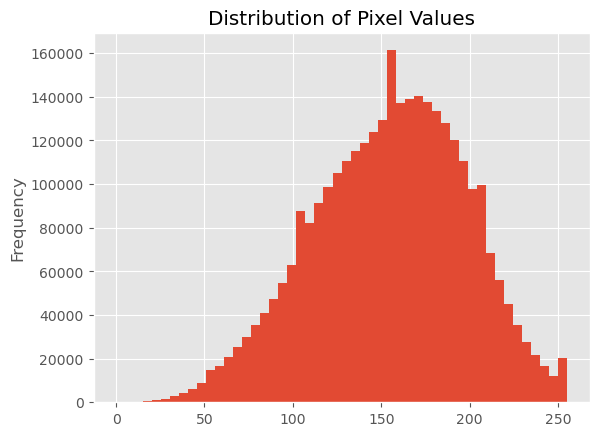

In [7]:
pd.Series(img_cv2.flatten()).plot(kind='hist',
                                  bins=50,
                                  title='Distribution of Pixel Values')
plt.show()

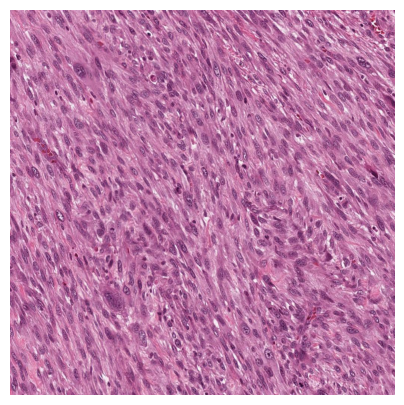

In [8]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(img_mpl)
ax.axis('off')
plt.show()

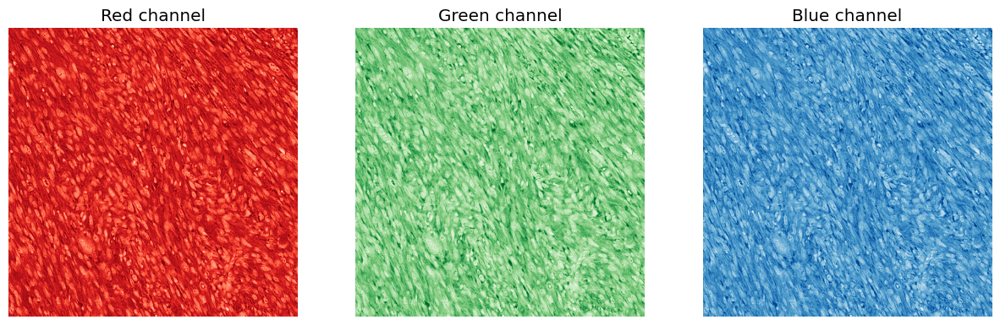

In [9]:
# Display RGB Channels of our image
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(img_mpl[:,:,0], cmap='Reds')
axs[1].imshow(img_mpl[:,:,1], cmap='Greens')
axs[2].imshow(img_mpl[:,:,2], cmap='Blues')
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
axs[0].set_title('Red channel')
axs[1].set_title('Green channel')
axs[2].set_title('Blue channel')
plt.show()

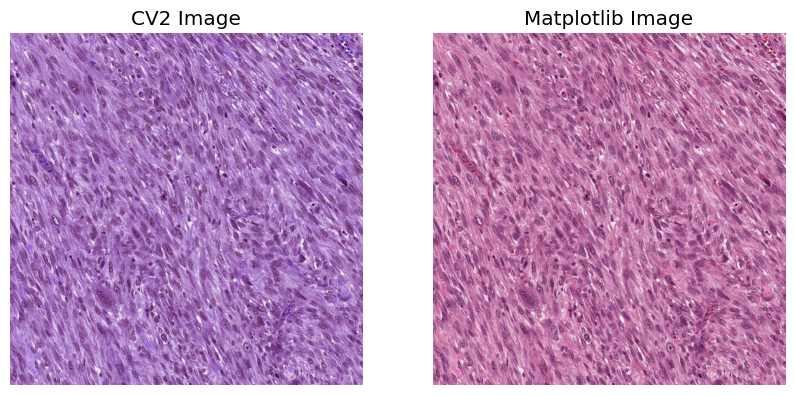

In [10]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img_cv2)
axs[1].imshow(img_mpl)
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('CV2 Image')
axs[1].set_title('Matplotlib Image')
plt.show()

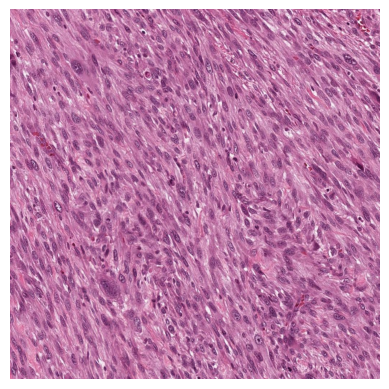

In [11]:
 # Converting from BGR to RGB
img_mpl_cv2 = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
fig, ax = plt.subplots()
ax.imshow(img_mpl_cv2)
ax.axis('off')
plt.show()

### Image manipulation

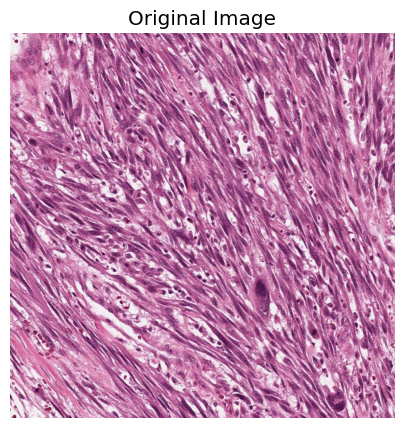

In [12]:
img = plt.imread(set1[4])
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(img)
ax.axis('off')
ax.set_title('Original Image')
plt.show()

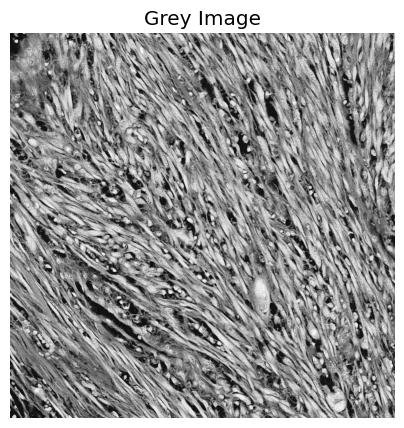

In [13]:
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(img_gray, cmap='Greys')
ax.axis('off')
ax.set_title('Grey Image')
plt.show()

In [14]:
# Converting the images to grey scale images
data=pd.DataFrame()
import os
rootdir = 'Dataset_Multiclass_Classification/edu/train/'
images=[];
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        img = cv2.imread(os.path.join(subdir, file))
        if img is not None:
            # normalize values
            #img = img / 255
            img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            
            img_gray2 = cv2.resize(img_gray, (200, 200))
            
            images.append(img_gray2)
            print("Loaded image with shape:", img_gray2.shape)
            #print(os.path.join(subdir, file))         
        elif file=='.DS_Store':
            continue
        else:
            print("Could not load image:", file)
            df1=pd.read_csv(str(subdir)+'/'+str(file),header=None)
            df1.head()
            data=pd.concat([data,df1])

            
            

     

Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (200, 200)
Loaded image with shape: (20

In [15]:
images

[array([[135, 155, 138, ..., 139, 151, 134],
        [158, 137, 146, ..., 143, 141, 143],
        [149, 135, 140, ..., 142, 131, 136],
        ...,
        [244, 244, 244, ..., 244, 244, 244],
        [244, 244, 244, ..., 244, 244, 244],
        [244, 244, 244, ..., 244, 244, 244]], dtype=uint8),
 array([[237, 243, 244, ..., 244, 244, 244],
        [244, 241, 244, ..., 244, 244, 244],
        [244, 244, 244, ..., 244, 244, 244],
        ...,
        [159, 160, 147, ..., 237, 201, 172],
        [135, 152, 199, ..., 170, 167, 173],
        [190, 162, 152, ..., 154, 184, 158]], dtype=uint8),
 array([[209, 237, 186, ..., 188, 197, 185],
        [181, 157, 179, ..., 209, 209, 223],
        [171, 239, 181, ..., 223, 163, 197],
        ...,
        [121, 245, 225, ..., 245, 245, 245],
        [199, 201, 248, ..., 245, 245, 245],
        [245, 244, 151, ..., 245, 245, 245]], dtype=uint8),
 array([[245, 237, 208, ..., 171, 171, 191],
        [161, 163, 156, ..., 127, 128, 131],
        [163, 16

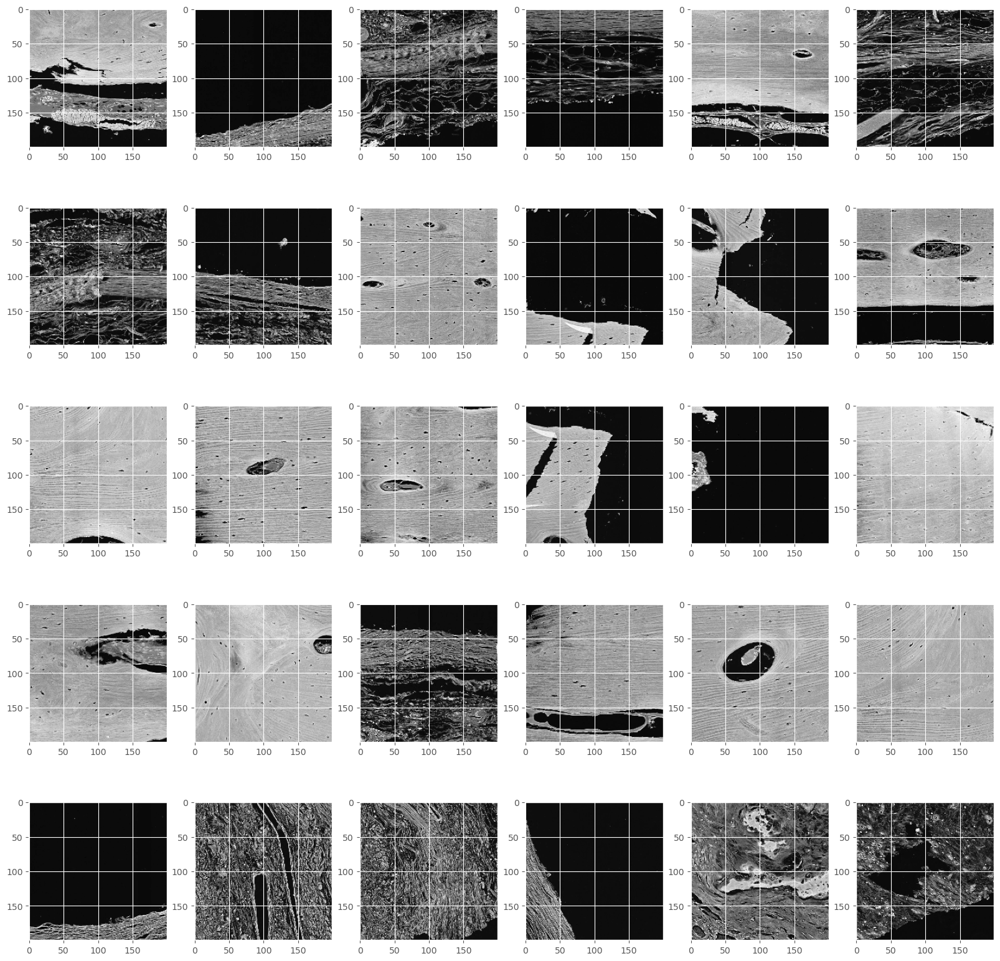

In [16]:
## plot some images  

import cv2 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm 

plt.figure(figsize=(20,20))
for i in range(30):
    plt.subplot(5,6,i+1)
    plt.imshow(images[i],cmap='Greys')

# Segment images

In [17]:
pip install segmentation-models

Note: you may need to restart the kernel to use updated packages.


In [18]:
from matplotlib import pyplot as plt
import cv2
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
%matplotlib inline

(-0.5, 1023.5, 1023.5, -0.5)

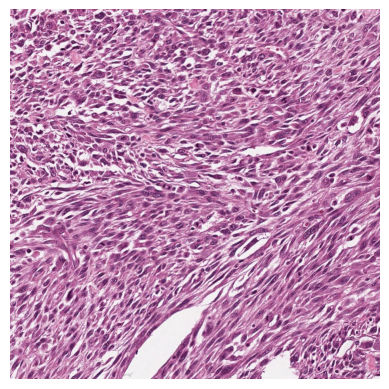

In [19]:
image = cv2.imread('C:/Users/dreamwalker/OneDrive/Desktop/Capstone-606-main/Dataset_Multiclass_Classification/edu/train/viable/Case-4-C31-27678-14221.jpg', cv2.IMREAD_UNCHANGED)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

(-0.5, 1023.5, 1023.5, -0.5)

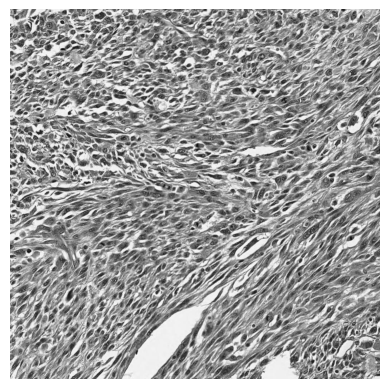

In [20]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap = "gray")
plt.axis('off')

True

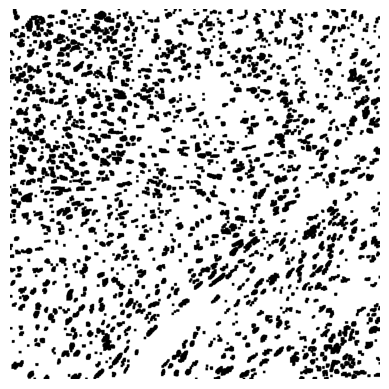

In [21]:
_ , mask = cv2.threshold(gray, 60, 255, cv2.THRESH_BINARY)
mask = cv2.erode(mask, np.ones((7, 7), np.uint8))
plt.imshow(mask, cmap = "gray")
plt.axis('off')
cv2.imwrite('thresholding.png', cv2.hconcat([image, np.stack((mask, mask, mask), axis=2)]))

(-0.5, 1023.5, 1023.5, -0.5)

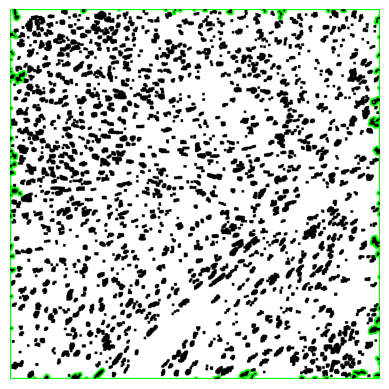

In [22]:
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

contours_img_before_filtering = mask.copy()
contours_img_before_filtering = cv2.cvtColor(contours_img_before_filtering, cv2.COLOR_GRAY2BGR)
cv2.drawContours(contours_img_before_filtering, contours, -1, (0, 255, 0), 3)
plt.imshow(contours_img_before_filtering)
plt.axis('off')

In [23]:
filtered_contours = []
df_mean_color = pd.DataFrame()
for idx, contour in enumerate(contours):
    area = int(cv2.contourArea(contour))

    # if area is higher than 3000:
    if area > 3000:
        filtered_contours.append(contour)
        # get mean color of contour:
        masked = np.zeros_like(image[:, :, 0])  # This mask is used to get the mean color of the specific bead (contour), for kmeans
        cv2.drawContours(masked, [contour], 0, 255, -1)

        B_mean, G_mean, R_mean, _ = cv2.mean(image, mask=masked)
        df = pd.DataFrame({'B_mean': B_mean, 'G_mean': G_mean, 'R_mean': R_mean}, index=[idx])
        df_mean_color = pd.concat([df_mean_color, df])

df_mean_color.head()

,B_mean,G_mean,R_mean
4,173.502814,133.885673,186.441611


True

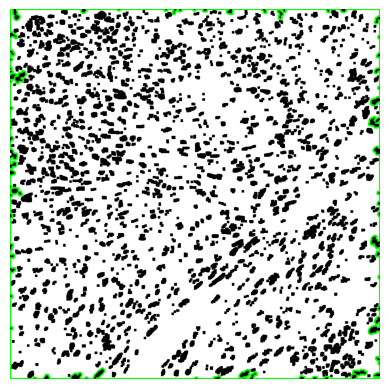

In [24]:
contours_img_after_filtering = mask.copy()
contours_img_after_filtering = cv2.cvtColor(contours_img_after_filtering, cv2.COLOR_GRAY2BGR)
cv2.drawContours(contours_img_after_filtering, tuple(filtered_contours), -1, (0, 255, 0), 3)

plt.imshow(contours_img_after_filtering)
plt.axis('off')

cv2.imwrite('contours.png', cv2.hconcat([contours_img_before_filtering, contours_img_after_filtering]))


In [25]:
km = KMeans( n_clusters=1)
df_mean_color['label'] = km.fit_predict(df_mean_color)

c:\Users\dreamwalker\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\dreamwalker\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [26]:
def draw_segmented_objects(image, contours, label_cnt_idx, bubbles_count):
    mask = np.zeros_like(image[:, :, 0])
    cv2.drawContours(mask, [contours[i] for i in label_cnt_idx], -1, (255), -1)
    masked_image = cv2.bitwise_and(image, image, mask=mask)
    masked_image = cv2.putText(masked_image, f'{bubbles_count} bubbles', (200, 1200), cv2.FONT_HERSHEY_SIMPLEX,
                        fontScale = 3, color = (255, 255, 255), thickness = 10, lineType = cv2.LINE_AA)
    return masked_image

(-0.5, 2047.5, 1023.5, -0.5)

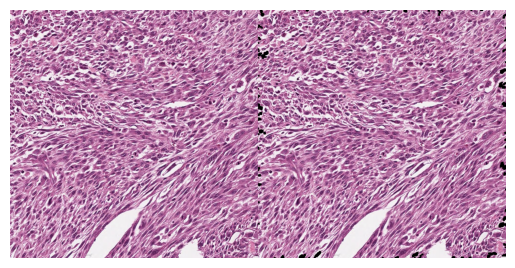

In [27]:
img = image.copy()
for label, df_grouped in df_mean_color.groupby('label'):
    bubbles_amount = len(df_grouped)
    masked_image = draw_segmented_objects(image, contours, df_grouped.index, bubbles_amount)
    img = cv2.hconcat([img, masked_image])

cv2.imwrite('color_segmentation.png', img)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB) )
plt.axis('off')

##### NOTE: Above is the process of how we segment images. since it is difficult to perform each and every image accurately we have used Apeer.io to mask our image data according to the labels.


### CNN Model

In [28]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_dir="Dataset_Multiclass_Classification/edu/train"
test_dir="Dataset_Multiclass_Classification/edu/test"

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

Found 533 images belonging to 3 classes.
Found 556 images belonging to 3 classes.


In [29]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history = model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=10,
    validation_data=test_generator,
    validation_steps=len(test_generator))

c:\Users\dreamwalker\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10


c:\Users\dreamwalker\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 14s 673ms/step - accuracy: 0.3941 - loss: 4.1235 - val_accuracy: 0.5665 - val_loss: 0.9959
Epoch 2/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/10


c:\Users\dreamwalker\anaconda3\Lib\contextlib.py:155: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


17/17 ━━━━━━━━━━━━━━━━━━━━ 13s 648ms/step - accuracy: 0.4990 - loss: 0.9880 - val_accuracy: 0.5737 - val_loss: 0.8271
Epoch 4/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 665us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 12s 623ms/step - accuracy: 0.6060 - loss: 0.8597 - val_accuracy: 0.5701 - val_loss: 0.8239
Epoch 6/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 647us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 12s 614ms/step - accuracy: 0.6511 - loss: 0.8517 - val_accuracy: 0.6960 - val_loss: 0.6767
Epoch 8/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 12s 609ms/step - accuracy: 0.7247 - loss: 0.6427 - val_accuracy: 0.6331 - val_loss: 0.7657
Epoch 10/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 703us/step - accuracy

In [30]:
scores = model.evaluate(test_generator, steps=len(test_generator))
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 262ms/step - accuracy: 0.6481 - loss: 0.7671
Test loss: 0.7836588621139526
Test accuracy: 0.633093535900116


In [31]:
import numpy as np
from sklearn.metrics import classification_report

y_pred = model.predict(test_generator, steps=len(test_generator))
y_pred = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

target_names = ['Non-Tumor', 'non-viable', 'viable']
print(classification_report(y_true, y_pred, target_names=target_names))

18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 263ms/step
              precision    recall  f1-score   support

   Non-Tumor       0.57      0.27      0.37       315
  non-viable       0.21      0.31      0.25       117
      viable       0.23      0.43      0.30       124

    accuracy                           0.31       556
   macro avg       0.34      0.34      0.31       556
weighted avg       0.42      0.31      0.33       556



18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 266ms/step


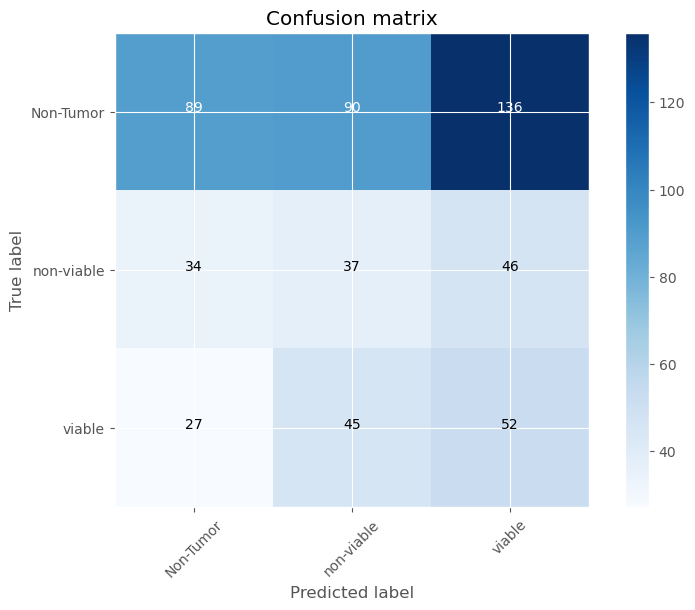

In [32]:
import numpy as np
import itertools
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Get the true labels
y_true = test_generator.classes

# Make the predictions
Y_pred = model.predict(test_generator, len(test_generator))
y_pred = np.argmax(Y_pred, axis=1)

# Get the confusion matrix
confusion_mtx = confusion_matrix(y_true, y_pred)

# Define the class names
class_names = ['Non-Tumor', 'non-viable', 'viable']

# Plot the confusion matrix
plt.figure(figsize=(8,6))
plt.imshow(confusion_mtx, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion matrix')
plt.colorbar()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)
thresh = confusion_mtx.max() / 2.
for i, j in itertools.product(range(confusion_mtx.shape[0]), range(confusion_mtx.shape[1])):
    plt.text(j, i, format(confusion_mtx[i, j], 'd'), horizontalalignment="center", color="white" if confusion_mtx[i, j] > thresh else "black")
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


### Mobile-Net

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os, glob
import tensorflow as tf
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [34]:
data_dir = "Dataset_Multiclass_Classification/edu/"
Osteosarcoma=[]
for file in os.listdir(data_dir):
    Osteosarcoma+=[file]
print(Osteosarcoma)
print(len(Osteosarcoma))

['.DS_Store', 'test', 'train']
3


In [35]:
img_height,img_width=128,128
batch_size=20

train_datagen = ImageDataGenerator(rescale=1./255)
train_generator1 = train_datagen.flow_from_directory(train_dir,
                                                target_size=(img_height,img_width),
                                                batch_size=batch_size,
                                                class_mode='categorical')
test_generator1 = train_datagen.flow_from_directory(test_dir,
                                                target_size=(img_height,img_width),
                                                batch_size=batch_size,
                                                class_mode='categorical')

Found 533 images belonging to 3 classes.
Found 556 images belonging to 3 classes.


In [36]:
precision=tf.keras.metrics.Precision()
recall=tf.keras.metrics.Recall()

In [37]:
def expansion_block(x,t,filters,block_id):
    prefix = 'block_{}_'.format(block_id)
    total_filters = t*filters
    x = Conv2D(total_filters,1,padding='same',use_bias=False, name =    prefix +'expand')(x)
    x = BatchNormalization(name=prefix +'expand_bn')(x)
    x = ReLU(6,name = prefix +'expand_relu')(x)
    return x
def depthwise_block(x,stride,block_id):
    prefix = 'block_{}_'.format(block_id)
    x = DepthwiseConv2D(3,strides=(stride,stride),padding ='same', use_bias = False, name = prefix + 'depthwise_conv')(x)
    x = BatchNormalization(name=prefix +'dw_bn')(x)
    x = ReLU(6,name = prefix +'dw_relu')(x)
    return x
def projection_block(x,out_channels,block_id):
    prefix = 'block_{}_'.format(block_id)
    x = Conv2D(filters=out_channels,kernel_size = 1,   padding='same',use_bias=False,name= prefix + 'compress')(x)
    x = BatchNormalization(name=prefix +'compress_bn')(x)
    return x
def Bottleneck(x,t,filters, out_channels,stride,block_id):
    y = expansion_block(x,t,filters,block_id)
    y = depthwise_block(y,stride,block_id)
    y = projection_block(y, out_channels,block_id)
    if y.shape[-1]==x.shape[-1]:
        y = add([x,y])
    return y
def MobileNet(input_shape = (100,100,1), n_classes=4):
    input = Input (input_shape)
    x = Conv2D(32,3,strides=(2,2),padding='same', use_bias=False)(input)
    x = BatchNormalization(name='conv1_bn')(x)
    x = ReLU(6, name='conv1_relu')(x)
    # 17 Bottlenecks
    x = depthwise_block(x,stride=1,block_id=1)
    x = projection_block(x, out_channels=16,block_id=1)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 24, stride = 2,block_id = 2)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 24, stride = 1,block_id = 3)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 32, stride = 2,block_id = 4)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 32, stride = 1,block_id = 5)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 32, stride = 1,block_id = 6)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 64, stride = 2,block_id = 7)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 64, stride = 1,block_id = 8)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 64, stride = 1,block_id = 9)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 64, stride = 1,block_id = 10)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 96, stride = 1,block_id = 11)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 96, stride = 1,block_id = 12)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 96, stride = 1,block_id = 13)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 160, stride = 2,block_id = 14)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 160, stride = 1,block_id = 15)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 160, stride = 1,block_id = 16)
    x = Bottleneck(x, t = 6, filters = x.shape[-1], out_channels = 320, stride = 1,block_id = 17)
    x = Conv2D(filters = 1280,kernel_size = 1,padding='same',use_bias=False, name = 'last_conv')(x)
    x = BatchNormalization(name='last_bn')(x)
    x = ReLU(6,name='last_relu')(x)
    x = GlobalAveragePooling2D(name='global_average_pool')(x)
    output = Dense(n_classes,activation='softmax')(x)
    model = Model(input, output)
    return model
n_classes = 3
input_shape = (128,128,3)

model = MobileNet(input_shape,n_classes)
model.summary()

Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 64, 64,    │        128 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu (ReLU)   │ (None, 64, 64,    │          0 │ conv1_bn[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 64, 64,    │        288 │ conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_dw_bn       │ (None, 64, 64,    │        128 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_dw_relu     │ (None, 64, 64,    │          0 │ block_1_dw_bn[0]… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_compress    │ (None, 64, 64,    │        512 │ block_1_dw_relu[… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_compress_bn │ (None, 64, 64,    │         64 │ block_1_compress… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_2_expand      │ (None, 64, 64,    │      1,536 │ block_1_compress… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_2_expand_bn   │ (None, 64, 64,    │        384 │ block_2_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_2_expand_relu │ (None, 64, 64,    │          0 │ block_2_expand_b… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_2_depthwise_… │ (None, 32, 32,    │        864 │ block_2_expand_r… │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_2_dw_bn       │ (None, 32, 32,    │        384 │ block_2_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_2_dw_relu     │ (None, 32, 32,    │          0 │ block_2_dw_bn[0]… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_2_compress    │ (None, 32, 32,    │      2,304 │ block_2_dw_relu[… │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_2_compress_bn │ (None, 32, 32,    │         96 │ block_2_compress

 Total params: 2,261,827 (8.63 MB)

 Trainable params: 2,227,715 (8.50 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [38]:
model.compile(optimizer='adam',loss="categorical_crossentropy",metrics=['accuracy',precision,recall])
hist=model.fit(train_generator1,epochs=20,batch_size=25, validation_data=test_generator1)

Epoch 1/20


c:\Users\dreamwalker\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


27/27 ━━━━━━━━━━━━━━━━━━━━ 28s 449ms/step - accuracy: 0.4766 - loss: 1.1518 - precision: 0.5154 - recall: 0.3636 - val_accuracy: 0.2104 - val_loss: 1.0782 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20
27/27 ━━━━━━━━━━━━━━━━━━━━ 12s 410ms/step - accuracy: 0.6856 - loss: 0.8539 - precision: 0.6999 - recall: 0.6527 - val_accuracy: 0.2104 - val_loss: 1.1652 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/20
27/27 ━━━━━━━━━━━━━━━━━━━━ 13s 443ms/step - accuracy: 0.7979 - loss: 0.5221 - precision: 0.8085 - recall: 0.7688 - val_accuracy: 0.2104 - val_loss: 1.1477 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/20
27/27 ━━━━━━━━━━━━━━━━━━━━ 13s 428ms/step - accuracy: 0.8922 - loss: 0.2935 - precision: 0.9007 - recall: 0.8851 - val_accuracy: 0.5665 - val_loss: 1.0463 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/20
27/27 ━━━━━━━━━━━━━━━━━━━━ 12s 410ms/step - accuracy: 0.8989 - loss: 0.2772 - precision: 0.9154 - recall: 0.8793 - val_accur

In [39]:
model.evaluate(test_generator1)
model.save("model/Mobilenet.h5")

28/28 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - accuracy: 0.5764 - loss: 1.5406 - precision: 0.5764 - recall: 0.5764


In [40]:
scores = model.evaluate(test_generator1, steps=len(test_generator1))
print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - accuracy: 0.5422 - loss: 1.6114 - precision: 0.5422 - recall: 0.5422
Test loss: 1.5486429929733276
Test accuracy: 0.5665467381477356


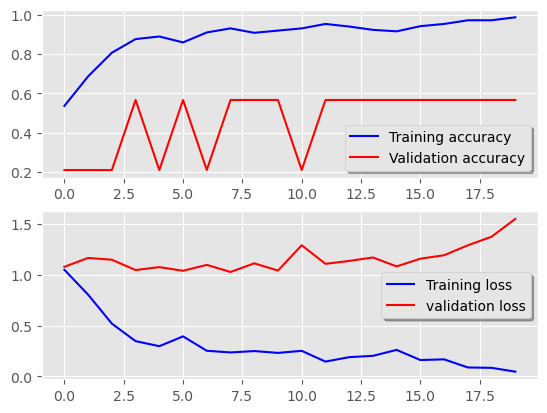

In [41]:
fig, ax = plt.subplots(2,1)
ax[0].plot(hist.history['accuracy'], color='b', label="Training accuracy")
ax[0].plot(hist.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(hist.history['loss'], color='b', label="Training loss")
ax[1].plot(hist.history['val_loss'], color='r', label="validation loss",axes =ax[1])
legend = ax[1].legend(loc='best', shadow=True)

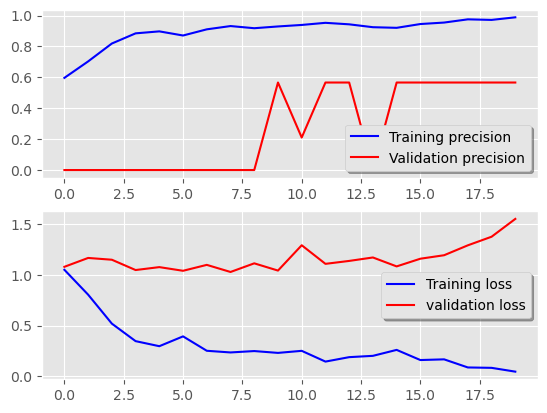

In [43]:
fig, ax = plt.subplots(2,1)
ax[0].plot(hist.history['precision'], color='b', label="Training precision")
ax[0].plot(hist.history['val_precision'], color='r',label="Validation precision")
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(hist.history['loss'], color='b', label="Training loss")
ax[1].plot(hist.history['val_loss'], color='r', label="validation loss",axes =ax[1])
legend = ax[1].legend(loc='best', shadow=
                      True)

In [44]:
filenames = test_generator1.filenames
nb_samples = len(filenames)
model_predict = model.predict(test_generator1,steps = nb_samples, verbose=2)

556/556 - 6s - 10ms/step


c:\Users\dreamwalker\anaconda3\Lib\contextlib.py:155: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


In [45]:
from sklearn.metrics import confusion_matrix
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


## BONE CNN

In [46]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Input, ZeroPadding2D, BatchNormalization, Activation, MaxPooling2D, Flatten, Dense
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.utils import shuffle
import cv2
import imutils
import numpy as np
import matplotlib.pyplot as plt
import time
from os import listdir

%matplotlib inline

In [47]:
def tumor_contour(image, plot=False):
    
    #import imutils
    #import cv2
    #from matplotlib import pyplot as plt
    
    # Convert the image to grayscale, and blur it slightly
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image, then perform a series of erosions +
    # dilations to remove any small regions of noise
    thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
    thresh = cv2.erode(thresh, None, iterations=2)
    thresh = cv2.dilate(thresh, None, iterations=2)

    # Find contours in thresholded image, then grab the largest one
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv2.contourArea)
    

    # Find the extreme points
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])
    
    # crop new image out of the original image using the four extreme points (left, right, top, bottom)
    new_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]            

    if plot:
        plt.figure()

        plt.subplot(1, 2, 1)
        plt.imshow(image)
        
        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        
        plt.title('Original Image')
            
        plt.subplot(1, 2, 2)
        plt.imshow(new_image)

        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)

        plt.title('Cropped Image')
        
        plt.show()
    
    return new_image

In [48]:
import os
def load_data(dir_list, image_size):
    """
    Read images, resize and normalize them. 
    Arguments:
        dir_list: list of strings representing file directories.
    Returns:
        X: A numpy array with shape = (#_examples, image_width, image_height, #_channels)
        y: A numpy array with shape = (#_examples, 1)
    """

    # load all images in a directory
    X = []
    y = [];count=0
    image_width, image_height = image_size
    for directory in dir_list:
        for filename in listdir(directory):
            #print(filename)
            #count+=1
            # load the image
            image = cv2.imread(directory + '//' + filename)
            # crop the brain and ignore the unnecessary rest part of the image
            image = tumor_contour(image, plot=False)
            # resize image
            image = cv2.resize(image, dsize=(image_width, image_height), interpolation=cv2.INTER_CUBIC)
            # normalize values
            image = image / 255.
            # convert image to numpy array and append it to X
            X.append(image)
            # append a value of 1 to the target array if the image
            # is in the folder named 'yes', otherwise append 0.
            if directory[-9:] == 'non-tumor':
                y.append([1])
            else:
                y.append([0])
              
    X = np.array(X)
    y = np.array(y)
    
    # Shuffle the data
    X, y = shuffle(X, y)
    
    print(f'Number of examples is: {len(X)}')
    print(f'X shape is: {X.shape}')
    print(f'y shape is: {y.shape}')
    
    return X, y

In [49]:
#'/Users/bharathamadhukiran/Downloads/binary'

augmented_path='Dataset_Binary_Classification/images'#augmented data contains both tumor and non tumor images
augmented_yes = augmented_path + '/tumor' 
augmented_no = augmented_path + '/non-tumor'

IMG_WIDTH, IMG_HEIGHT = (240, 240)

X, y = load_data([augmented_yes, augmented_no], (IMG_WIDTH, IMG_HEIGHT))

Number of examples is: 1089
X shape is: (1089, 240, 240, 3)
y shape is: (1089, 1)


In [50]:
def plot_sample_images(X, y, n=50):
    """
    Plots n sample images for both values of y (labels).
    Arguments:
        X: A numpy array with shape = (#_examples, image_width, image_height, #_channels)
        y: A numpy array with shape = (#_examples, 1)
    """
    
    for label in [0,1]:
        # grab the first n images with the corresponding y values equal to label
        images = X[np.argwhere(y == label)]
        n_images = images[:n]
        
        columns_n = 10
        rows_n = int(n/ columns_n)

        plt.figure(figsize=(20, 10))
        
        i = 1 # current plot        
        for image in n_images:
            plt.subplot(rows_n, columns_n, i)
            plt.imshow(image[0])
            
            # remove ticks
            plt.tick_params(axis='both', which='both', 
                            top=False, bottom=False, left=False, right=False,
                           labelbottom=False, labeltop=False, labelleft=False, labelright=False)
            
            i += 1
        
        label_to_str = lambda label: "Yes" if label == 1 else "No"
        plt.suptitle(f" Tumor: {label_to_str(label)}")
        plt.show()

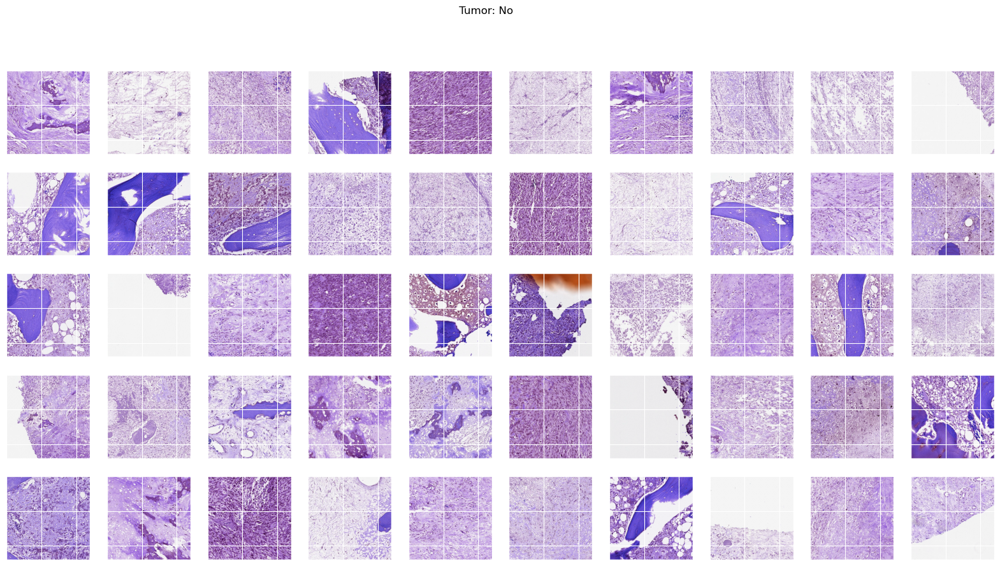

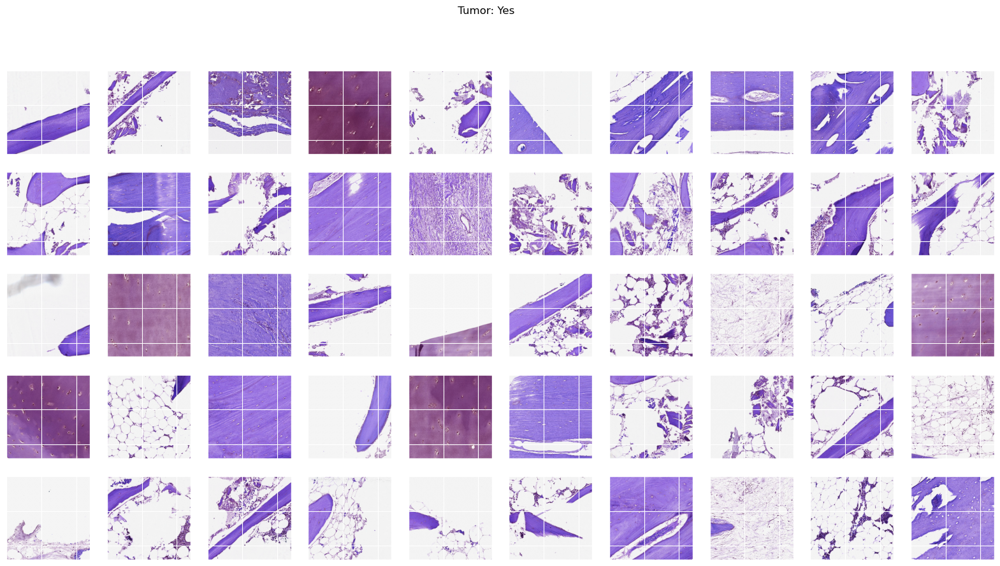

In [51]:
plot_sample_images(X, y)

In [52]:
def split_data(X, y, test_size=0.2):
       
    """
    Splits data into training, development and test sets.
    Arguments:
        X: A numpy array with shape = (#_examples, image_width, image_height, #_channels)
        y: A numpy array with shape = (#_examples, 1)
    Returns:
        X_train: A numpy array with shape = (#_train_examples, image_width, image_height, #_channels)
        y_train: A numpy array with shape = (#_train_examples, 1)
        X_val: A numpy array with shape = (#_val_examples, image_width, image_height, #_channels)
        y_val: A numpy array with shape = (#_val_examples, 1)
        X_test: A numpy array with shape = (#_test_examples, image_width, image_height, #_channels)
        y_test: A numpy array with shape = (#_test_examples, 1)
    """
    
    X_train, X_test_val, y_train, y_test_val = train_test_split(X, y, test_size=test_size)
    X_test, X_val, y_test, y_val = train_test_split(X_test_val, y_test_val, test_size=0.5)
    
    return X_train, y_train, X_val, y_val, X_test, y_test

In [53]:
X_train, y_train, X_val, y_val, X_test, y_test = split_data(X, y, test_size=0.3)

In [54]:
print ("number of training examples = " + str(X_train.shape[0]))
print ("number of development examples = " + str(X_val.shape[0]))
print ("number of test examples = " + str(X_test.shape[0]))
print ("X_train shape: " + str(X_train.shape))
print ("Y_train shape: " + str(y_train.shape))
print ("X_val (dev) shape: " + str(X_val.shape))
print ("Y_val (dev) shape: " + str(y_val.shape))
print ("X_test shape: " + str(X_test.shape))
print ("Y_test shape: " + str(y_test.shape))

number of training examples = 762
number of development examples = 164
number of test examples = 163
X_train shape: (762, 240, 240, 3)
Y_train shape: (762, 1)
X_val (dev) shape: (164, 240, 240, 3)
Y_val (dev) shape: (164, 1)
X_test shape: (163, 240, 240, 3)
Y_test shape: (163, 1)


In [55]:
# Nicely formatted time string
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return f"{h}:{m}:{round(s,1)}"

In [56]:
def compute_f1_score(y_true, prob):
    # convert the vector of probabilities to a target vector
    y_pred = np.where(prob > 0.5, 1, 0)
    
    score = f1_score(y_true, y_pred)
    
    return score

In [57]:
def build_model(input_shape):
    """
    Arugments:
        input_shape: A tuple representing the shape of the input of the model. shape=(image_width, image_height, #_channels)
    Returns:
        model: A Model object.
    """
    # Define the input placeholder as a tensor with shape input_shape. 
    X_input = Input(input_shape) # shape=(?, 240, 240, 3)
    
    # Zero-Padding: pads the border of X_input with zeroes
    X = ZeroPadding2D((2, 2))(X_input) # shape=(?, 244, 244, 3)
    
    # CONV -> BN -> RELU Block applied to X
    X = Conv2D(32, (7, 7), strides = (1, 1), name = 'conv0')(X)
    X = BatchNormalization(axis = 3, name = 'bn0')(X)
    X = Activation('relu')(X) # shape=(?, 238, 238, 32)
    
    # MAXPOOL
    X = MaxPooling2D((4, 4), name='max_pool0')(X) # shape=(?, 59, 59, 32) 
    
    # MAXPOOL
    X = MaxPooling2D((4, 4), name='max_pool1')(X) # shape=(?, 14, 14, 32)
    
    # FLATTEN X 
    X = Flatten()(X) # shape=(?, 6272)
    # FULLYCONNECTED
    X = Dense(1, activation='sigmoid', name='fc')(X) # shape=(?, 1)
    
    # Create model. This creates your Keras model instance, you'll use this instance to train/test the model.
    model = Model(inputs = X_input, outputs = X, name='BoneDetectionModel')
    
    return model

In [58]:
IMG_SHAPE = (IMG_WIDTH, IMG_HEIGHT, 3)

In [59]:
model = build_model(IMG_SHAPE)

In [60]:
model.summary()

Model: "BoneDetectionModel"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 240, 240, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 244, 244, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv0 (Conv2D)                  │ (None, 238, 238, 32)   │         4,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn0 (BatchNormalization)        │ (None, 238, 238, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 238, 238, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pool0 (MaxPooling2D)        │ (None, 59, 59, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pool1 (MaxPooling2D)        │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc (Dense)                      │ (None, 1)              │         6,273 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,137 (43.50 KB)

 Trainable params: 11,073 (43.25 KB)

 Non-trainable params: 64 (256.00 B)

In [61]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [62]:
# tensorboard
log_file_name = f'bone_tumor_detection_cnn_{int(time.time())}'
tensorboard = TensorBoard(log_dir=f'logs/{log_file_name}')

In [63]:
from keras.callbacks import ModelCheckpoint

filepath = "models/cnn-parameters-improvement-{epoch:02d}-{val_accuracy:.2f}.keras"
# Save the model with the best validation (development) accuracy till now
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')


In [64]:
start_time = time.time()

model.fit(x=X_train, y=y_train, batch_size=32, epochs=10, validation_data=(X_val, y_val), callbacks=[tensorboard, checkpoint])

end_time = time.time()
execution_time = (end_time - start_time)
print(f"Elapsed time: {hms_string(execution_time)}")

Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - accuracy: 0.4805 - loss: 1.9501
Epoch 1: val_accuracy improved from -inf to 0.45732, saving model to models/cnn-parameters-improvement-01-0.46.keras
24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 309ms/step - accuracy: 0.4828 - loss: 1.9249 - val_accuracy: 0.4573 - val_loss: 1.0074
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - accuracy: 0.7575 - loss: 0.4964
Epoch 2: val_accuracy did not improve from 0.45732
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 295ms/step - accuracy: 0.7578 - loss: 0.4969 - val_accuracy: 0.4573 - val_loss: 1.6194
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.7856 - loss: 0.4858
Epoch 3: val_accuracy did not improve from 0.45732
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 286ms/step - accuracy: 0.7857 - loss: 0.4854 - val_accuracy: 0.4573 - val_loss: 2.2080
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.8323 - loss: 0.4094
Epoch 4: val_accuracy did not improve from 0.45732
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 280ms

In [65]:
start_time = time.time()

model.fit(x=X_train, y=y_train, batch_size=32, epochs=3, validation_data=(X_val, y_val), callbacks=[tensorboard, checkpoint])

end_time = time.time()
execution_time = (end_time - start_time)
print(f"Elapsed time: {hms_string(execution_time)}")

Epoch 1/3
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.8244 - loss: 0.3863
Epoch 1: val_accuracy improved from 0.49390 to 0.78659, saving model to models/cnn-parameters-improvement-01-0.79.keras
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 290ms/step - accuracy: 0.8255 - loss: 0.3851 - val_accuracy: 0.7866 - val_loss: 0.4798
Epoch 2/3
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.8950 - loss: 0.2487
Epoch 2: val_accuracy did not improve from 0.78659
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 285ms/step - accuracy: 0.8953 - loss: 0.2493 - val_accuracy: 0.7195 - val_loss: 0.5006
Epoch 3/3
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - accuracy: 0.8993 - loss: 0.2887
Epoch 3: val_accuracy improved from 0.78659 to 0.79268, saving model to models/cnn-parameters-improvement-03-0.79.keras
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 276ms/step - accuracy: 0.8995 - loss: 0.2877 - val_accuracy: 0.7927 - val_loss: 0.4751
Elapsed time: 0:0:20.9


In [66]:
start_time = time.time()

model.fit(x=X_train, y=y_train, batch_size=32, epochs=3, validation_data=(X_val, y_val), callbacks=[tensorboard, checkpoint])

end_time = time.time()
execution_time = (end_time - start_time)
print(f"Elapsed time: {hms_string(execution_time)}")

Epoch 1/3
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.9120 - loss: 0.2548
Epoch 1: val_accuracy did not improve from 0.79268
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 293ms/step - accuracy: 0.9119 - loss: 0.2544 - val_accuracy: 0.7073 - val_loss: 0.5468
Epoch 2/3
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9314 - loss: 0.2146
Epoch 2: val_accuracy improved from 0.79268 to 0.81098, saving model to models/cnn-parameters-improvement-02-0.81.keras
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 286ms/step - accuracy: 0.9310 - loss: 0.2152 - val_accuracy: 0.8110 - val_loss: 0.4434
Epoch 3/3
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.9179 - loss: 0.2303
Epoch 3: val_accuracy did not improve from 0.81098
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 283ms/step - accuracy: 0.9179 - loss: 0.2298 - val_accuracy: 0.7378 - val_loss: 0.5387
Elapsed time: 0:0:21.1


In [67]:
start_time = time.time()

model.fit(x=X_train, y=y_train, batch_size=32, epochs=5, validation_data=(X_val, y_val), callbacks=[tensorboard, checkpoint])

end_time = time.time()
execution_time = (end_time - start_time)
print(f"Elapsed time: {hms_string(execution_time)}")

Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.9051 - loss: 0.2482
Epoch 1: val_accuracy did not improve from 0.81098
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 295ms/step - accuracy: 0.9036 - loss: 0.2516 - val_accuracy: 0.6951 - val_loss: 0.5976
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.8915 - loss: 0.2586
Epoch 2: val_accuracy did not improve from 0.81098
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 285ms/step - accuracy: 0.8923 - loss: 0.2580 - val_accuracy: 0.6890 - val_loss: 0.6924
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.9363 - loss: 0.1986
Epoch 3: val_accuracy did not improve from 0.81098
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 280ms/step - accuracy: 0.9364 - loss: 0.1983 - val_accuracy: 0.6524 - val_loss: 0.8167
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.9382 - loss: 0.1881
Epoch 4: val_accuracy did not improve from 0.81098
24/24 ━━━━━━━━━━━━━━━━━━━━ 7s 277ms/step - accuracy: 0.9380 - loss: 0.1884 - val_accuracy: 0.5976 - val_l

In [68]:
history = model.history.history

In [69]:
for key in history.keys():
    print(key)

accuracy
loss
val_accuracy
val_loss


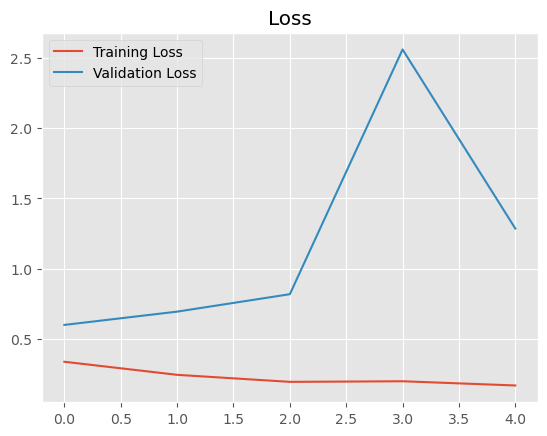

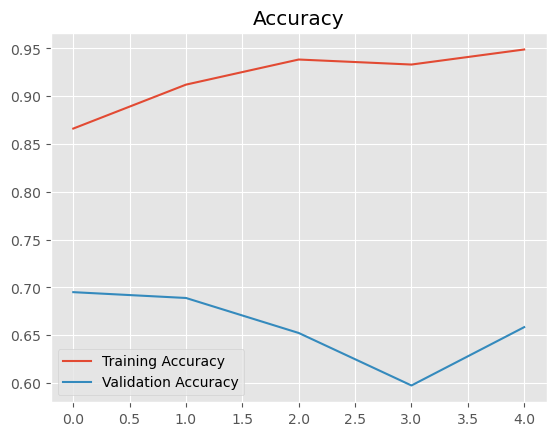

In [70]:
def plot_metrics(history):
    
    train_loss = history['loss']
    val_loss = history['val_loss']
    train_acc = history['accuracy']
    val_acc = history['val_accuracy']
    
    # Loss
    plt.figure()
    plt.plot(train_loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.title('Loss')
    plt.legend()
    plt.show()
    
    # Accuracy
    plt.figure()
    plt.plot(train_acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.title('Accuracy')
    plt.legend()
    plt.show()
plot_metrics(history) 

### Load the best accurate model

In [71]:
from keras.models import load_model

# Save the model in .h5 format
model.save("models/cnn-parameters-improvement-09-0.66.h5")

# Load the model
best_model = load_model(filepath="models/cnn-parameters-improvement-09-0.66.h5")

#best_model = load_model(filepath='C:/Users/dreamwalker/OneDrive/Desktop/Capstone-606-main/models/cnn-parameters-improvement-09-0.66.model')

In [72]:
best_model.metrics_names

['loss', 'compile_metrics']

In [73]:
loss, acc = best_model.evaluate(x=X_test, y=y_test)

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.6516 - loss: 1.2756


In [74]:
y_test_prob = best_model.predict(X_test)

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


#### F1 score for test data.

In [75]:
f1score = compute_f1_score(y_test, y_test_prob)
print(f"F1 score test data: {f1score}")

F1 score test data: 0.47058823529411764


In [76]:
y_val_prob = best_model.predict(X_val)
#y_val_prob

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


#### F1 score for validation data

In [77]:
f1score_val = compute_f1_score(y_val, y_val_prob)
print(f"F1 score validation data: {f1score_val}")

F1 score validation data: 0.4166666666666667


In [78]:
#from sklearn.metrics import classification_report
#print(classification_report(y_val, y_val_prob))

import numpy as np
from sklearn.metrics import classification_report

# True labels
true_labels = y_val

# Flatten the true labels
true_labels = true_labels.ravel()

# Predicted probabilities
predicted_probabilities = y_val_prob

# Convert probabilities to binary predictions based on a threshold
threshold = 0.5
predicted_labels = (predicted_probabilities >= threshold).astype(int)

# Generate classification report
report = classification_report(true_labels, predicted_labels)

# Print the classification report
print(report)


              precision    recall  f1-score   support

           0       0.62      0.99      0.76        89
           1       0.95      0.27      0.42        75

    accuracy                           0.66       164
   macro avg       0.78      0.63      0.59       164
weighted avg       0.77      0.66      0.60       164



# Confusion Matrix for model

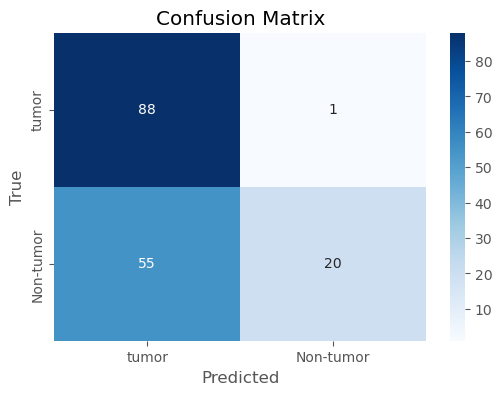

In [79]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# True labels
true_labels = y_val

# Flatten the true labels
true_labels = true_labels.ravel()

# Predicted probabilities
predicted_probabilities = y_val_prob

# Convert probabilities to binary predictions based on a threshold
threshold = 0.5
predicted_labels = (predicted_probabilities >= threshold).astype(int)

# Generate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Define class labels
class_labels = ['tumor', 'Non-tumor']

# Create a heatmap of the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


## Data Distribution

In [80]:
def data_percentage(y):
    
    m=len(y)
    n_positive = np.sum(y)
    n_negative = m - n_positive
    
    pos_prec = (n_positive* 100.0)/ m
    neg_prec = (n_negative* 100.0)/ m
    
    print(f"Number of examples: {m}")
    print(f"Percentage of positive examples: {pos_prec}%, number of pos examples: {n_positive}") 
    print(f"Percentage of negative examples: {neg_prec}%, number of neg examples: {n_negative}") 

In [81]:
data_percentage(y)

Number of examples: 1089
Percentage of positive examples: 49.219467401285584%, number of pos examples: 536
Percentage of negative examples: 50.780532598714416%, number of neg examples: 553


In [82]:
print("Training Data:")
data_percentage(y_train)
print("Validation Data:")
data_percentage(y_val)
print("Testing Data:")
data_percentage(y_test)

Training Data:
Number of examples: 762
Percentage of positive examples: 50.5249343832021%, number of pos examples: 385
Percentage of negative examples: 49.4750656167979%, number of neg examples: 377
Validation Data:
Number of examples: 164
Percentage of positive examples: 45.73170731707317%, number of pos examples: 75
Percentage of negative examples: 54.26829268292683%, number of neg examples: 89
Testing Data:
Number of examples: 163
Percentage of positive examples: 46.625766871165645%, number of pos examples: 76
Percentage of negative examples: 53.374233128834355%, number of neg examples: 87


### Let's check the model performance on a random image

In [83]:
def get_class_label(class_index):
    return "Non-Tumor" if class_index == 1 else "Tumor"

def predict_image(path):
    # Preprocess the image
    image = cv2.imread(path)
    image = cv2.resize(image, dsize=(240, 240), interpolation=cv2.INTER_CUBIC)
    image = image / 255.
    image = np.expand_dims(image, axis=0) 

    # Make the prediction
    prediction = best_model.predict(image)

    # Get the predicted probability and class label
    predicted_prob = prediction[0][0]  # Assuming binary classification
    predicted_class = 1 if predicted_prob >= 0.5 else 0
    predicted_label = get_class_label(predicted_class)

    # Plot the image
    plt.imshow(image[0])
    plt.axis('off')
    plt.title(f"Predicted Class: {predicted_label}, Probability of No Tumor: {predicted_prob:.4f}")
    plt.show()

    # Return the prediction probability and class label
    return predicted_prob, predicted_label

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


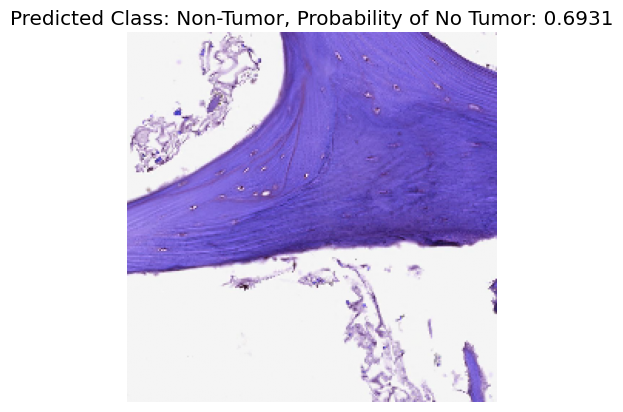

In [84]:
# Assuming 'image' is your input image and 'best_model' is the trained model
path = 'Dataset_Binary_Classification/images/non-tumor/Case-3-A7-10464-40567.jpg'
prediction_prob, prediction_class = predict_image(path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


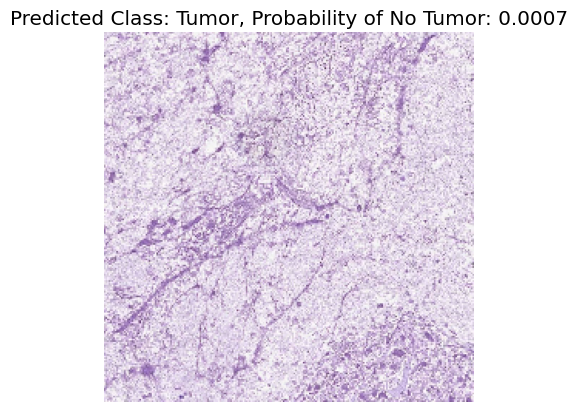

In [85]:
# Assuming 'image' is your input image and 'best_model' is the trained model
path = 'Dataset_Binary_Classification/images/tumor/Case-3-A7-31694-7282.jpg'
prediction_prob, prediction_class = predict_image(path)

##### We have used Apeer.com tool to mask our image data . This tool helps in training the images with inout of some images which have been marked manually.So by levraging this tool we have masked image data. 

# U-Net

In [86]:
import tensorflow as tf
import os
import random
import numpy as np
from tqdm import tqdm
from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

seed = 42
np.random.seed = seed

IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3

DATA_PATH = 'Dataset_Binary_Classification/'

image_path_tumor = os.path.join(DATA_PATH, 'images/tumor')
image_path_non_tumor = os.path.join(DATA_PATH, 'images/non-tumor')
mask_path_tumor = os.path.join(DATA_PATH, 'masks/tumor')
mask_path_non_tumor = os.path.join(DATA_PATH, 'masks/non-tumor')

# Get the list of image files from tumor and non-tumor folders
image_files_tumor = os.listdir(image_path_tumor)
image_files_non_tumor = os.listdir(image_path_non_tumor)

# Combine the image files from both tumor and non-tumor folders
image_files = image_files_tumor + image_files_non_tumor

# Shuffle the image files
random.shuffle(image_files)

X = np.zeros((len(image_files), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
y = np.zeros((len(image_files), IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)



print('Resizing images and masks')
for n, image_file in tqdm(enumerate(image_files), total=len(image_files)):
    if image_file == '.DS_Store':
        continue

    # Determine whether the image is from the tumor or non-tumor folder
    if image_file in image_files_tumor:
        image_path = os.path.join(image_path_tumor, image_file)
        mask_path = os.path.join(mask_path_tumor, image_file)
    else:
        image_path = os.path.join(image_path_non_tumor, image_file)
        mask_path = os.path.join(mask_path_non_tumor, image_file)
    
    

    img = imread(image_path)
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X[n] = img
    
    if not os.path.exists(mask_path):
        continue

    mask = imread(mask_path)
    mask = resize(mask, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    mask_slice = mask[..., 0] 
    mask_slice = np.expand_dims(mask_slice, axis=-1)
    y[n] = mask_slice
    

print('Done!')


Resizing images and masks


100%|██████████| 1089/1089 [01:40<00:00, 10.86it/s]

Done!


In [87]:
print("Shape of the mask image and original image data")
print("X:",X.shape,"y:",y.shape)

Shape of the mask image and original image data
X: (1089, 256, 256, 3) y: (1089, 256, 256, 1)


### Train test split of data

In [88]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

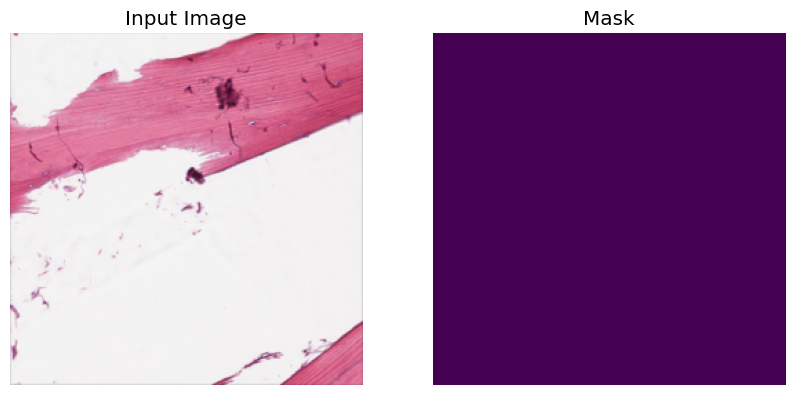

In [89]:
# Generate a random index to select a sample image
image_index = random.randint(0, len(X_train))

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Input Image')
plt.axis('off')
plt.imshow(X_train[image_index])

# Display the corresponding mask
plt.subplot(1, 2, 2)
plt.title('Mask')
plt.axis('off')
plt.imshow(np.squeeze(y_train[image_index]), cmap='viridis')  # Assuming mask is grayscale
plt.show()


# Model building

In [90]:
num_classes = 1

inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
b1 = tf.keras.layers.BatchNormalization()(c1)
r1 = tf.keras.layers.ReLU()(b1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(r1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
b2 = tf.keras.layers.BatchNormalization()(c2)
r2 = tf.keras.layers.ReLU()(b2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(r2)
 
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
b3 = tf.keras.layers.BatchNormalization()(c3)
r3 = tf.keras.layers.ReLU()(b3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(r3)
 
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
b4 = tf.keras.layers.BatchNormalization()(c4)
r4 = tf.keras.layers.ReLU()(b4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(r4)

c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
b4 = tf.keras.layers.BatchNormalization()(c4)
r4 = tf.keras.layers.ReLU()(b4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(r4)

c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
b5 = tf.keras.layers.BatchNormalization()(c5)
r5 = tf.keras.layers.ReLU()(b5)
c5 = tf.keras.layers.Dropout(0.3)(r5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path 
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
u6 = tf.keras.layers.BatchNormalization()(u6)
u6 = tf.keras.layers.ReLU()(u6)

 
u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(u6)
u7 = tf.keras.layers.concatenate([u7, c3])
u7 = tf.keras.layers.BatchNormalization()(u7)
u7 = tf.keras.layers.ReLU()(u7)

 
u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(u7)
u8 = tf.keras.layers.concatenate([u8, c2])
u8 = tf.keras.layers.BatchNormalization()(u8)
u8 = tf.keras.layers.ReLU()(u8)
 
u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(u8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
u9 = tf.keras.layers.BatchNormalization()(u9)
u9 = tf.keras.layers.ReLU()(u9)

 
outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='sigmoid')(u9)

In [91]:
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [92]:
callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')]

model.fit(X_train, y_train, validation_data=(X_test,y_test), batch_size=16, epochs=3, callbacks=callbacks)

Epoch 1/3
46/46 ━━━━━━━━━━━━━━━━━━━━ 35s 669ms/step - accuracy: 0.8600 - loss: 0.4584 - val_accuracy: 0.9946 - val_loss: 0.0380
Epoch 2/3
46/46 ━━━━━━━━━━━━━━━━━━━━ 30s 652ms/step - accuracy: 0.9994 - loss: 0.1420 - val_accuracy: 1.0000 - val_loss: 0.0628
Epoch 3/3
46/46 ━━━━━━━━━━━━━━━━━━━━ 30s 655ms/step - accuracy: 0.9998 - loss: 0.0817 - val_accuracy: 1.0000 - val_loss: 0.0784


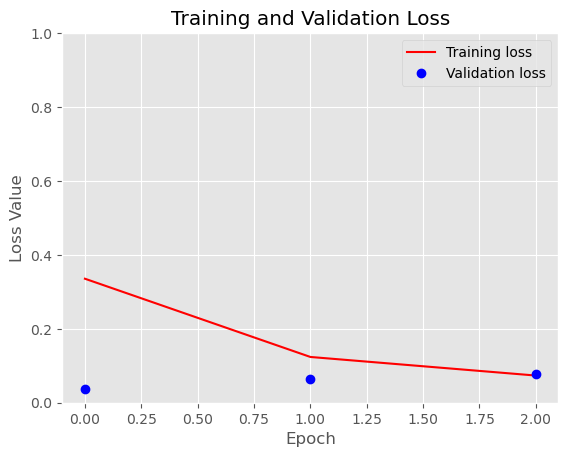

In [93]:
loss = model.history.history['loss']
val_loss = model.history.history['val_loss']

plt.figure()
plt.plot( loss, 'r', label='Training loss')
plt.plot( val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


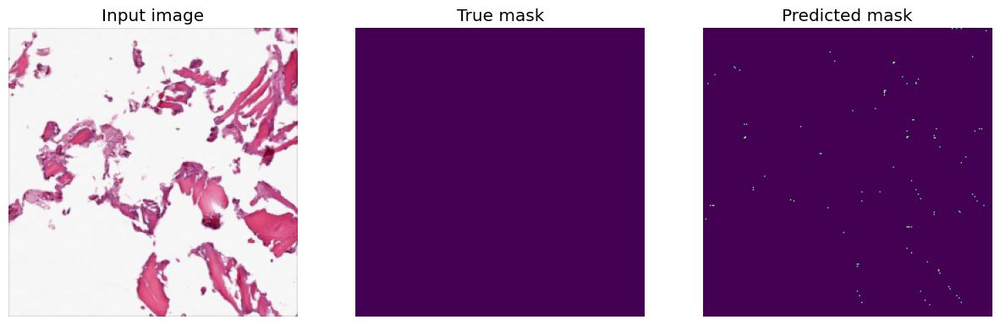

In [94]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input image', 'True mask', 'Predicted mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()
  
i = random.randint(0, len(X_test))
sample_image = X_test[i]
sample_mask = y_test[i]
prediction = model.predict(sample_image[tf.newaxis, ...])[0]
predicted_mask = (prediction > 0.3).astype(np.uint8)
display([sample_image, sample_mask,predicted_mask])